# DFT atom

In [1]:
using Pkg;
Pkg.activate("../.");

using SchrodingerEquationSolver
using SchrodingerEquationSolver: Grids, Potentials, MathUtils, Hydrogen, InitialConditions,
                                 OneDSchrodingerEquationSolver, OneDPoissonEquationSolver,
                                 EigenvalueFinders, AtomBasisSet, Density, ExchangeCorrelation
using Plots

  Activating project at `~/Desktop/physics_coding_projects/julia/SchrodingerEquationSolver`


In [2]:
#Define parameters and produce an exponential grid.
r_max::Float64=50.0;#Max radius of space grid.
Z::Int64=86;#Atomic number, also used as the charge of coulomb potential.

In [3]:

#grid definition
grid_stru= Grids.init_exponential_grid_structure(r_max, Z);
N=grid_stru.N;
print("grid size ", N)

grid size 8991

In [4]:
#Initialization of potentials and energies

#Initializing coulomb potential due to nuclei charge.
V_colu::Vector{Float64}= Potentials.coulomb_potential(Z, grid_stru.grid);
#Initializing Hartree potential due to electron density. 
V_hartree::Vector{Float64}=zeros(Float64, N);
#Initializing exchange potential.
V_x::Vector{Float64}=zeros(Float64, N);
#Initializing correlation potential.
V_c::Vector{Float64}=zeros(Float64, N);
#Initializing energy exchange potential.
E_xp::Vector{Float64}=zeros(Float64, N);
#Initializing energy correlation potential.
E_cp::Vector{Float64}=zeros(Float64, N);
#Initializing exchange + correlation potential.
V_xcp::Vector{Float64}=zeros(Float64, N);
#Initializing the density.
density_in::Vector{Float64}= zeros(Float64, N);
#Initializing total energy
E_total::Float64=1.0;
#Initializing total energy step before
E_total_before::Float64=2.0;
#Initializing energy from energy eigenvalues
E_eigen::Float64=0.0;
#Initializing exchange correlation potential value after integral
V_xc::Float64= 0.0;
#Initializing Hartree energy
E_hartree::Float64= 0.0;
#Initializing exchange energy
E_x::Float64= 0.0;
#Initializing correlation enrgy
E_c::Float64= 0.0;

E_kinetic::Float64= 0.0;
#Initializing basis set data structure
basis= AtomBasisSet.init_atom_basis_set(Z, grid_stru.grid);

In [5]:
for i_orbi in basis.orbitals
    println(i_orbi.name)
    println(i_orbi.E)
end

1s
-3698.0
2s
-924.5
2p
-924.5
3s
-410.8888888888889
3p
-410.8888888888889
4s
-231.125
3d
-410.8888888888889
4p
-231.125
5s
-147.92
4d
-231.125
5p
-147.92
6s
-102.72222222222223
4f
-231.125
5d
-147.92
6p
-102.72222222222223


In [6]:
#Energy minimization loop 
while abs(E_total - E_total_before) > 10.0e-8
    E_eigen=0.0;
    #Loop over every orbital to solve independent particle Schrodinger equation.
    for i_orbi in basis.orbitals
        #println(i_orbi.name)
        #angular potential for l orbital
        V_angu= Potentials.angular_potential(i_orbi.l, grid_stru.grid);
        #Assemble effective potential.
        V_effe= V_colu .+ V_angu .+ V_hartree .+ V_x .+ V_c;
        V_effe_max= maximum(V_effe)
        V_effe_min= minimum(V_effe)
        energy_interval= EigenvalueFinders.guess_energy_interval(i_orbi.E, V_effe_max, V_effe_min);
        E_grid= Grids.uniform_grid(energy_interval[1], energy_interval[2], 200); #List with the energy grid points.

        E_intervals= EigenvalueFinders.find_eigenvalue_intervals(E_grid, V_effe, grid_stru,
                    InitialConditions.atom_exponential_grid,
                        OneDSchrodingerEquationSolver.solver_exponential_grid, numb_inter=1);
        #print("here ")
        u_temp, ei_temp= EigenvalueFinders.illinois_eigenvalue_finder(E_intervals[1], V_effe, 
        grid_stru,InitialConditions.atom_exponential_grid, 
        OneDSchrodingerEquationSolver.solver_exponential_grid ,
        l=i_orbi.l);
        #Update eigenvalue and eigenfunction in the basis set data structure.
        i_orbi.E=ei_temp;
        i_orbi.u=u_temp;
        E_eigen+= i_orbi.occu*ei_temp;
        #println(i_orbi.E)
        #println("--------------------------------")

    end
    #Update E_total_before from the E_total from the previous step.
    E_total_before= float(E_total);
    V_no_kinetic= V_colu .+ V_hartree .+ V_x .+ V_c;
    #Calculate density with new basis set.
    density_out= Density.calculate_density(basis);
    #Smooth the density with linear mixing (combination) of the previous and current densities.
    density_in= Density.linear_mixing(density_in, density_out, alpha=0.10);
    #Solve Poisson equation to find the new Hartree potential.
    V_hartree, x_= OneDPoissonEquationSolver.solver_exponential_grid_forward_back(Z, density_in, grid_stru);
    #Calculate new exchange and correlation potentials.
    V_x, E_xp, V_c, E_cp= ExchangeCorrelation.potentials(density_in);
    #Add exchange and correlation potentials.
    V_xcp= V_x .+ V_c;
    #Integrals to calculate energy components.
    E_kinetic= E_eigen - 4.0*pi*MathUtils.energy_integral_exponential_grid(grid_stru, density_in, V_no_kinetic);
    #V_xc= 4.0*pi*MathUtils.energy_integral_exponential_grid(grid_stru, density_in, V_xcp)

    E_hartree= 0.5*4.0*pi*MathUtils.energy_integral_exponential_grid(grid_stru, density_in, V_hartree);

    E_x= 4.0*pi*MathUtils.energy_integral_exponential_grid(grid_stru, density_in, E_xp);

    E_c= 4.0*pi*MathUtils.energy_integral_exponential_grid(grid_stru, density_in, E_cp);
    E_colu= 4.0*pi*MathUtils.energy_integral_exponential_grid(grid_stru, density_in, V_colu);
    #Calculate total energy.
    E_total= E_kinetic + E_hartree + E_x + E_c + E_colu;
    #println(E_total)
    #println("*****************************************")
end
println("E_kinetic ", E_kinetic)
println("E_hartree ", E_hartree)
println("E_x + E_c ", (E_x + E_c))
println("E_total ", E_total)
for i_orbi in basis.orbitals
    println(i_orbi.name)
    println(i_orbi.E)
end

E_kinetic 21854.67274114761
E_hartree 8632.061105419161
E_x + E_c -381.91597351367994
E_total -21861.346867425964
1s
-3204.7577951811218
2s
-546.5797720491198
2p
-527.534807705031
3s
-133.3711115988193
3p
-124.17482060999832
4s
-31.232850851361754
3d
-106.94695038957909
4p
-27.11103199581924
5s
-5.891770405491362
4d
-19.452041947646116
5p
-4.41078962387742
6s
-0.6286083582552663
4f
-8.955370427750541
5d
-1.9134129442620367
6p
-0.29516816164660153


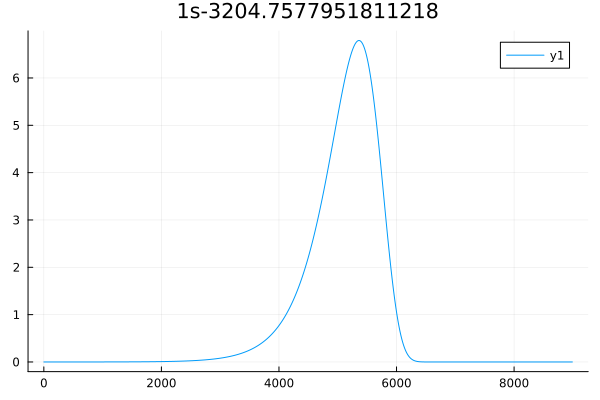

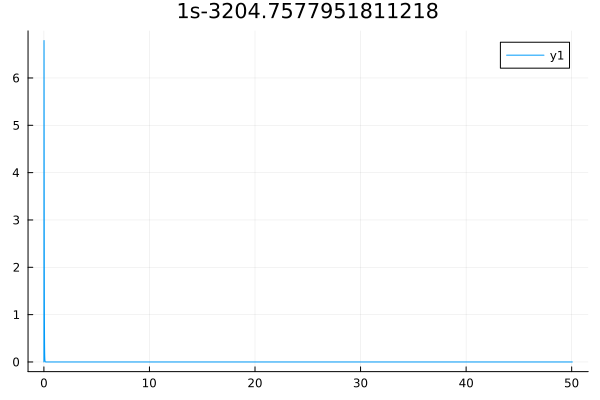

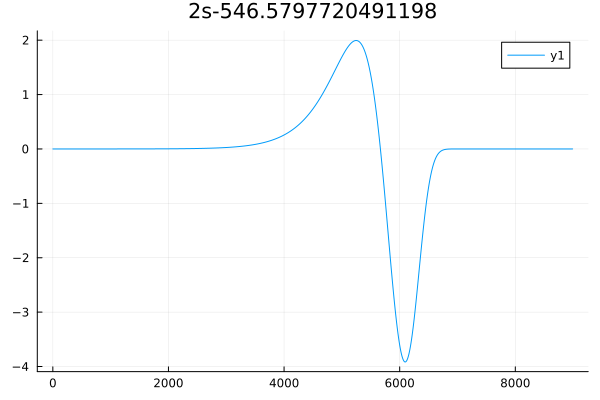

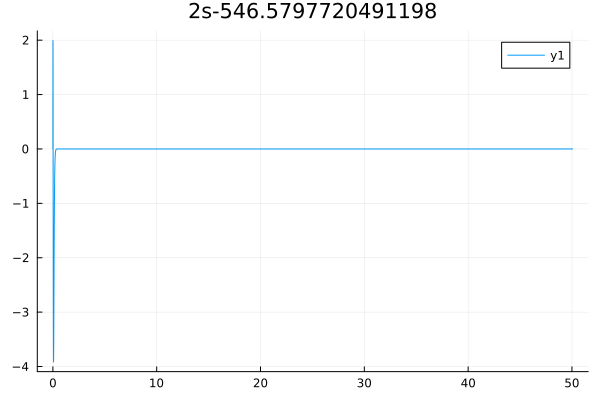

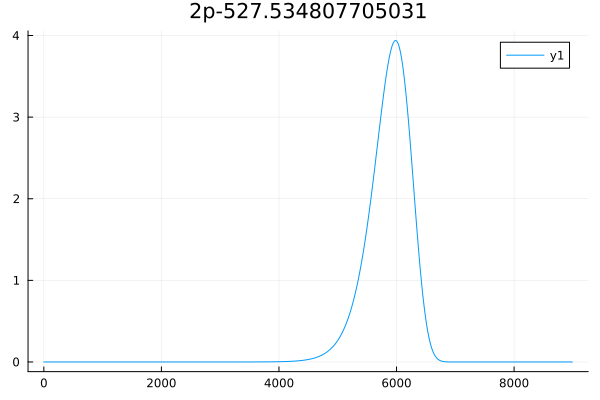

...

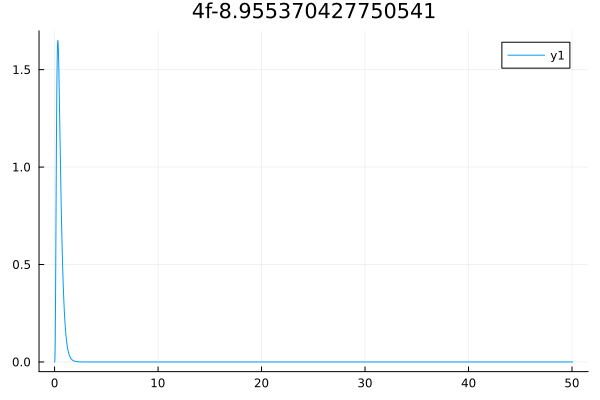

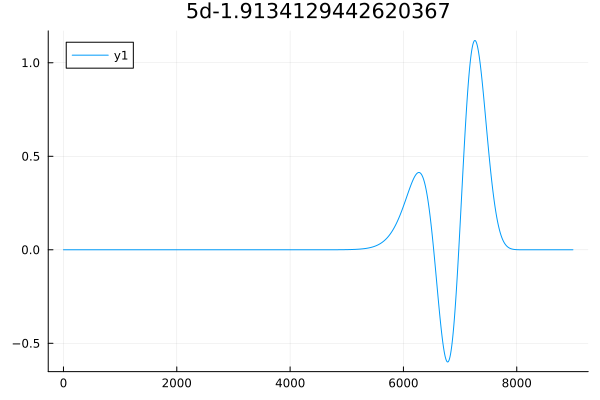

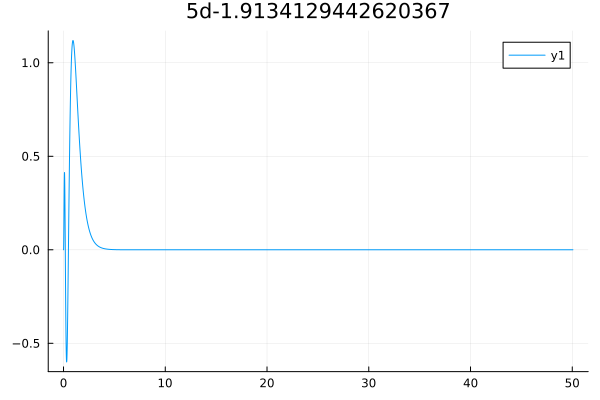

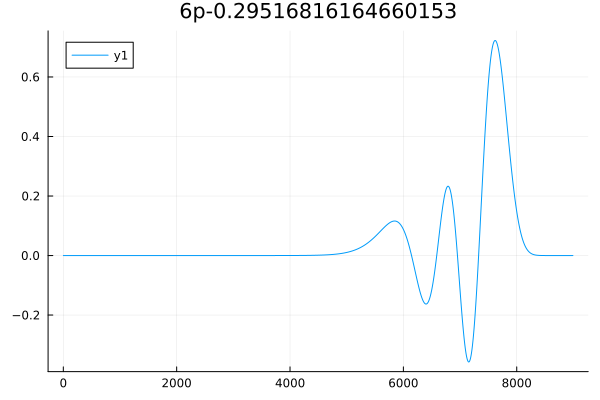

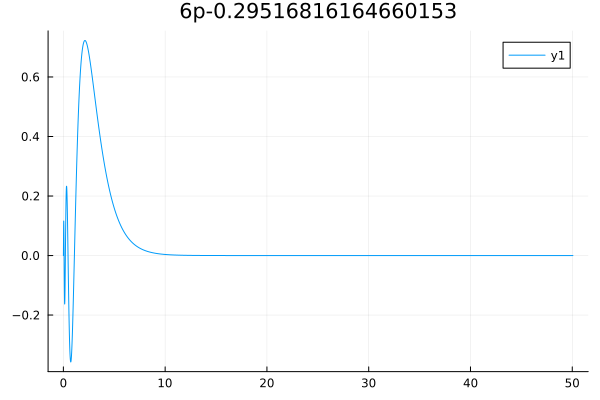

In [7]:
for i_orbi in basis.orbitals
    #println(i_orbi.name)
    #println(i_orbi.E)
    Plots.display(plot(grid_stru.grid_i, i_orbi.u, title= string(i_orbi.name,i_orbi.E)))
    Plots.display(plot(grid_stru.grid, i_orbi.u, title= string(i_orbi.name,i_orbi.E)))
end

#Define parameters and produce an exponential grid.

r_max::Float64=50.0;#Max radius of space grid.

Z::Int64=36;#Atomic number, also used as the charge of coulomb potential.



E_total -2750.1479408019813

18m 45.6s

using numb_inter=0


E_total -2750.147940802046

3m 18.0s

using numb_inter=1

************************************************************************************

#Define parameters and produce an exponential grid.

r_max::Float64=50.0;#Max radius of space grid.

Z::Int64=86;#Atomic number, also used as the charge of coulomb potential.


E_total -21861.34686904983

39m 47.1s

using numb_inter=0

E_total -21861.346869049754

7m 12.6s

using numb_inter=1
